# Image Filtering

The main objectives of this module are:

* Implement point filtering with look-up tables.
* Implement region filtering with kernel convolution, morphological operations and edge detection.
* Understand spatial frequency information with the Fourier transform.

## 1. Look-up tables

Look-up tables are a very useful tool to perform simple pixel-level filtering of an image.

Numpy arrays indexing ([see reference here](http://docs.scipy.org/doc/numpy/user/basics.indexing.html)) is a very powerful tool, but can be a bit counter-intuitive at first. We will use it to quickly create and use look-up tables to transform an image.

Look at the short example below. 

We construct an image with 4 possible values for each pixel (-> $I(x,y) \in \{0,1,2,3\}$). We then build the following LUT:

|Input value|Output value|
|--|--|
|0|2|
|1|3|
|2|1|
|3|0|

And we apply it on the image.

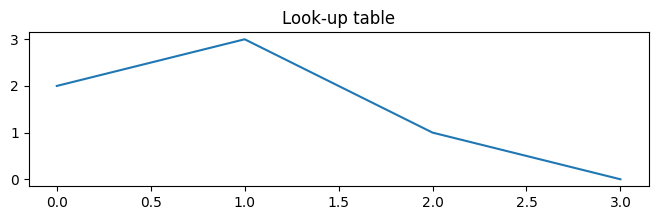

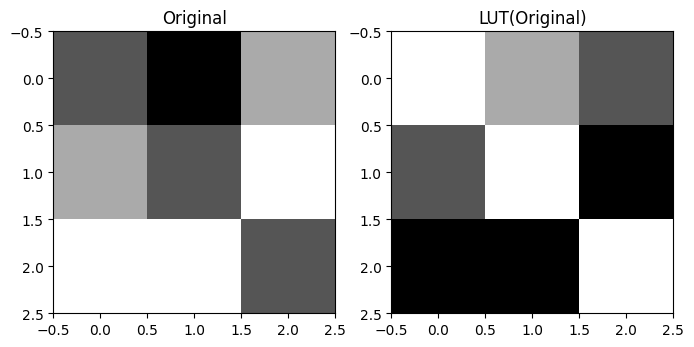

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import cm
%matplotlib inline

# Let's create a 3x3 "image" with 4 possible pixel values (in [0,3])
im = np.array([[1,0,2],[2,1,3],[3,3,1]])

# look-up table is a vector of size 4 mapping the new value for the pixels of m
lut = np.array([2,3,1,0]) # maps 0 -> 2, 1 -> 3, 2 -> 1, 3 -> 0

plt.figure(figsize=(8,2))
plt.plot(lut)
plt.title('Look-up table')
plt.show()

# we can use numpy vector indexing to apply the look-up table:
new_im = lut[im] # This will create a new array with the same size as m

plt.figure(figsize=(8,4))
plt.subplot(1,2,1) #supblot is useful to display images side-by-side
plt.imshow(im, cmap=cm.gray)
plt.title('Original')
plt.subplot(1,2,2)
plt.imshow(new_im, cmap=cm.gray)
plt.title('LUT(Original)')
plt.show()

So a LUT for a grayscale image will be a 256-length vector. The first value in this vector will be the "new value to give all pixels that are equal to 0 in the original image".

For inverting a greyscale image, this would mean that we want all 0s to become 255s, all 1s to become 254s, etc...

In [2]:
from skimage.io import imread, imshow, imsave
# so lut_inv[0] = 255, lut_inv[255] = 0
inv_lut = np.arange(255,-1,-1)
print(inv_lut)

[255 254 253 252 251 250 249 248 247 246 245 244 243 242 241 240 239 238
 237 236 235 234 233 232 231 230 229 228 227 226 225 224 223 222 221 220
 219 218 217 216 215 214 213 212 211 210 209 208 207 206 205 204 203 202
 201 200 199 198 197 196 195 194 193 192 191 190 189 188 187 186 185 184
 183 182 181 180 179 178 177 176 175 174 173 172 171 170 169 168 167 166
 165 164 163 162 161 160 159 158 157 156 155 154 153 152 151 150 149 148
 147 146 145 144 143 142 141 140 139 138 137 136 135 134 133 132 131 130
 129 128 127 126 125 124 123 122 121 120 119 118 117 116 115 114 113 112
 111 110 109 108 107 106 105 104 103 102 101 100  99  98  97  96  95  94
  93  92  91  90  89  88  87  86  85  84  83  82  81  80  79  78  77  76
  75  74  73  72  71  70  69  68  67  66  65  64  63  62  61  60  59  58
  57  56  55  54  53  52  51  50  49  48  47  46  45  44  43  42  41  40
  39  38  37  36  35  34  33  32  31  30  29  28  27  26  25  24  23  22
  21  20  19  18  17  16  15  14  13  12  11  10   

**Starting from this example, create the following LUTs** and apply them to the "walking.jpg" image:
1. For inverting an image (so that $0 \rightarrow 255$, $255 \rightarrow 0$)
1. To keep only graylevel such that $g \ge t$, setting all other values to 0.
1. To reduce the number of gray levels from 256 to 8 (so that $255 \rightarrow 7$, $0 \rightarrow 0$).
1. To "stretch" the histogram so that, given a **minimum value** $T_{min}$ and a **maximum value** $T_{max}$, we have :
    * If $I(x,y) < T_{min}$, the new value is set to 0
    * If $I(x,y) > T_{max}$, the new value is set to 255
    * Values between $T_{min}$ and $T_{max}$ are stretched to cover the entire histogram.
1. to perform an **equalization** of the walking.jpg image (so that the histogram becomes "as flat as possible")

[[188 186 190 ... 196 203 195]
 [189 187 189 ... 194 200 190]
 [189 187 188 ... 194 200 190]
 ...
 [ 32  34  36 ...  27  28  28]
 [ 33  35  38 ...  24  23  22]
 [ 37  37  39 ...  24  21  19]]


Text(0.5, 1.0, 'LUT(Original image)')

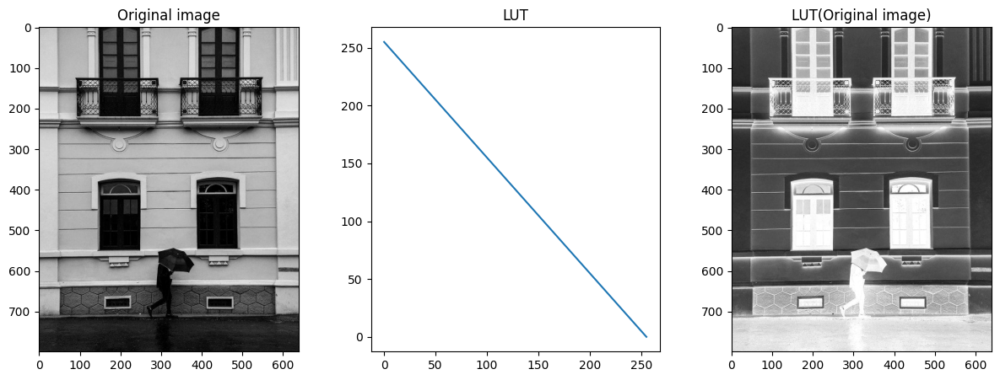

In [3]:
#1. For inverting an image
from skimage.io import imread,imshow,imsave
im = imread('walking.jpg')
print(im)
inv_im = inv_lut[im]
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im, cmap = plt.cm.gray)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(inv_lut)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(inv_im, cmap=plt.cm.gray)
plt.title("LUT(Original image)")

[  0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.
   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0.   0. 180. 181.
 182. 183. 184. 185. 186. 187. 188. 189. 190. 191. 192. 193. 194. 195.
 196. 

Text(0.5, 1.0, 'LUT(Original image)')

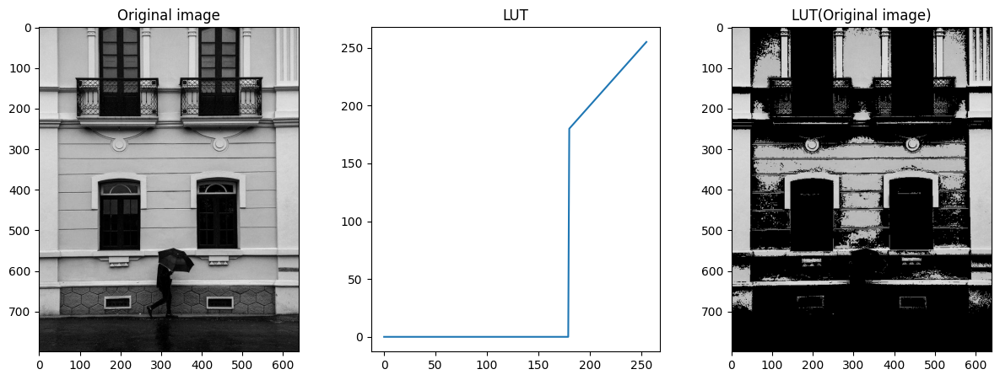

In [4]:
#2 Keep graylevels above a certain threshold
def tresh_apply(v_tresh: int):
    lut_tresh = np.zeros((256,))
    for i in range(v_tresh,256):
        lut_tresh[i] = i
    return(lut_tresh)

lut_tresh = tresh_apply(180) #arbitrary treshold
print(lut_tresh)
tresh_im = lut_tresh[im]

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im, cmap = plt.cm.gray)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(lut_tresh)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(tresh_im, cmap=plt.cm.gray)
plt.title("LUT(Original image)")

Let's have a quick look at the effect on the histogram:

[]

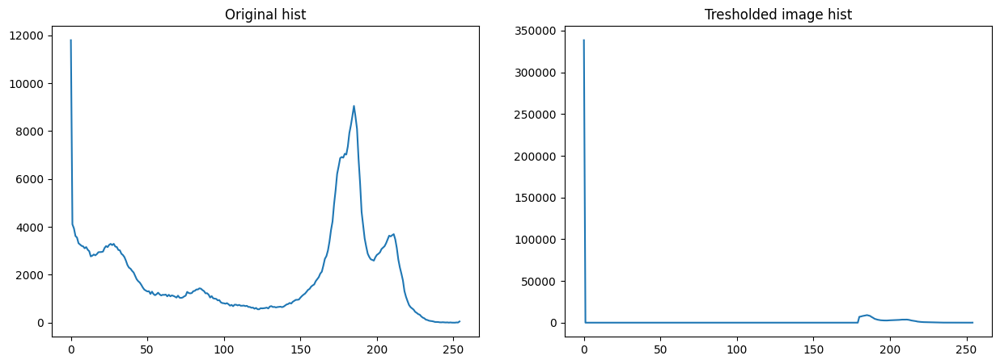

In [5]:
im_hist , im_bins = np.histogram(im.flatten(),range(256))
tresh_im_hist, tresh_im_bins = np.histogram(tresh_im.flatten(),range(256))
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(im_hist)
plt.title("Original hist")
plt.subplot(1,2,2)
plt.plot(tresh_im_hist)
plt.title("Tresholded image hist")
plt.plot()


As we can see, we have a huge peak at 0, as all pixels that had a value between 0 and the threshold have been set to 0. The rest of the histogram has the same shape as before (except it obviously looks flatter next to the 0 peak).



Next, we want to reduce the number of gray levels from 256 to 8 (meaning that we reduce the "dynamic range" of the image). So we want lut[0] = 0 and lut[255] = 7:

[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1
 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 1 2 2 2 2 2 2 2 2 2 2
 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 2 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3
 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5 5
 5 5 5 5 5 5 5 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6 6
 6 6 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7 7]


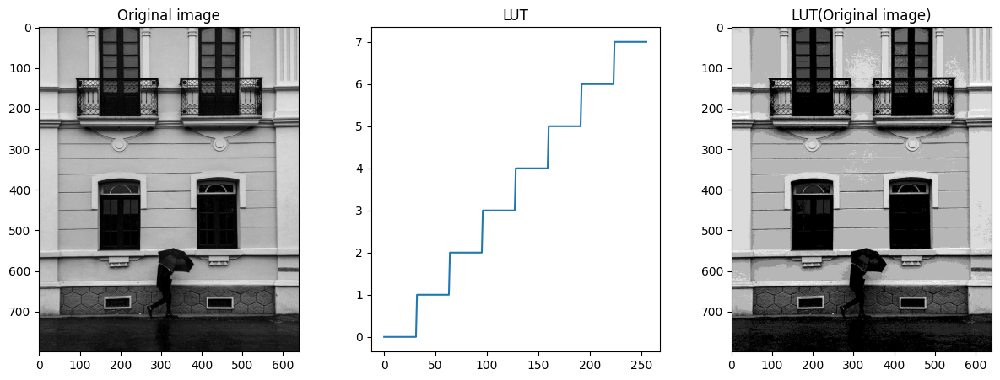

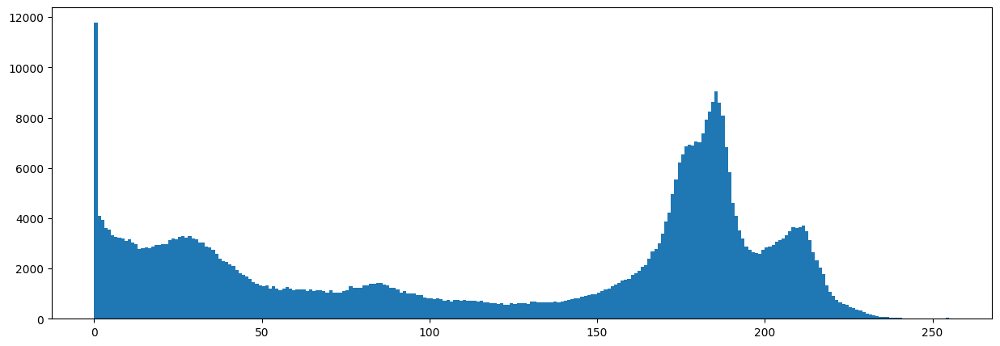

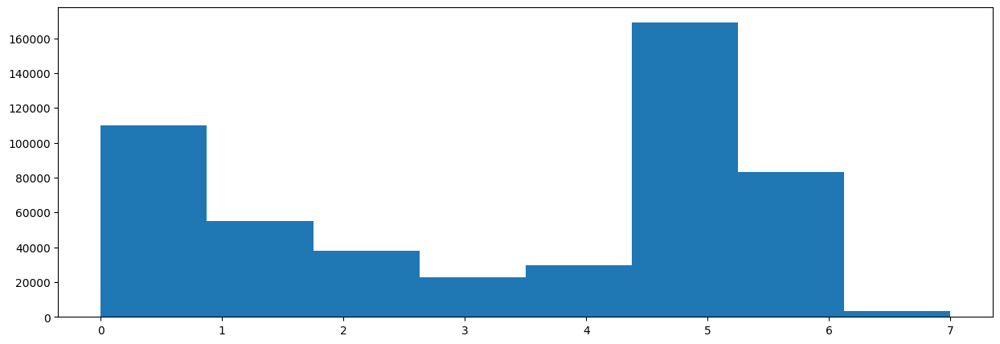

In [6]:
#3 To reduce the number of gray levels from 256 to 8

def reduce_dyn_range(nb_levels):
    lut = np.arange(256)
    lut = lut // (256//nb_levels)
    return(lut)


lut_dyn_r = reduce_dyn_range(8)
reduced_dyn_im = lut_dyn_r[im]
print(lut_dyn_r)

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im, cmap = plt.cm.gray)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(lut_dyn_r)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(reduced_dyn_im, cmap=plt.cm.gray)
plt.title("LUT(Original image)")

plt.figure(figsize=(15,5))
plt.hist(im.flatten(), range(256))
plt.figure(figsize=(15,5))
plt.hist(reduced_dyn_im.flatten(), bins = 8)
plt.show()


Now we want to "stretch" the histogram by doing an auto-level. The goal of stretching the histogram is to better use the dynamic range. If we look at the histogram from the original image, we can see that we mostly don't use values above around 220. 

In other words, there are very few "bright" pixels in the image. On the other end, we do have black pixels, so we don't need to stretch in that direction. For the purpose of demonstrating histogram stretching, however, we will still use a T_min of 5.

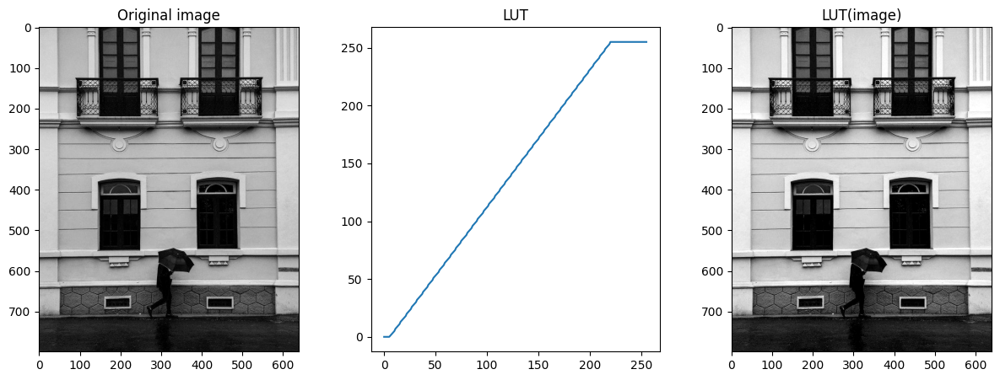

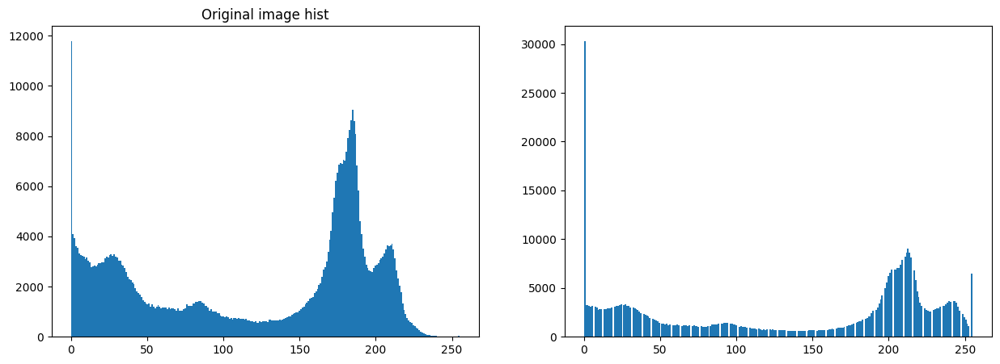

In [7]:
#4 To "stretch" the histogram 
def auto_level(T_min, T_max):
    lut = np.arange(256) #some artifact about the int approximation, but we don't put it in float because we have to use de same type of the image array
    lut[:T_min] = 0
    lut[T_max:] = 255
    lut[T_min:T_max] = 255*((lut[T_min:T_max]-T_min)/(T_max-T_min))
    return lut

lut_auto_level = auto_level(5,220)
auto_level_im = lut_auto_level[im]

plt.figure(figsize=(15,5))
plt.gray()
plt.subplot(1,3,1)
plt.imshow(im)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(lut_auto_level)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(auto_level_im)
plt.title("LUT(image)")

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(im.flatten(),bins=256)
plt.title("Original image hist")
plt.subplot(1,2,2)
plt.hist(auto_level_im.flatten(),bins = 256)
plt.show()
    

With that, we make the "bright" parts of the image "whiter", and the dark part darker, without losing much information in the process. A way to automate the selection of the thresholds would be to use percentiles in the cumulative histogram. For instance, we could say that we use the percentiles 2 and 98 as lower and upper thresholds, so as to only "lose" 4\% of the pixel information in the process:

In [8]:
#Finds tresholds based on percentiles
def find_T_min_max(im):
    hist, bins = np.histogram(im, bins=np.arange(257), density=True)
    c_hist = np.zeros((256,))
    c = 0
    for v in range(256):
        c += hist[v]
        c_hist[v] = c
    c_hist /= c_hist.max()

    for v in range(1,256):
        if c_hist[v] > 0.02 : 
            T_min = v-1
            break

    for v in range(256):
        if c_hist[255-v] < 0.98 : 
            T_max = 255-v+1
            break

    return T_min, T_max, c_hist

T_min, T_max, c_hist= find_T_min_max(im)
print(T_min,T_max, c_hist[T_min], c_hist[T_max])




0 217 0.023063986232790993 0.9826521433041305


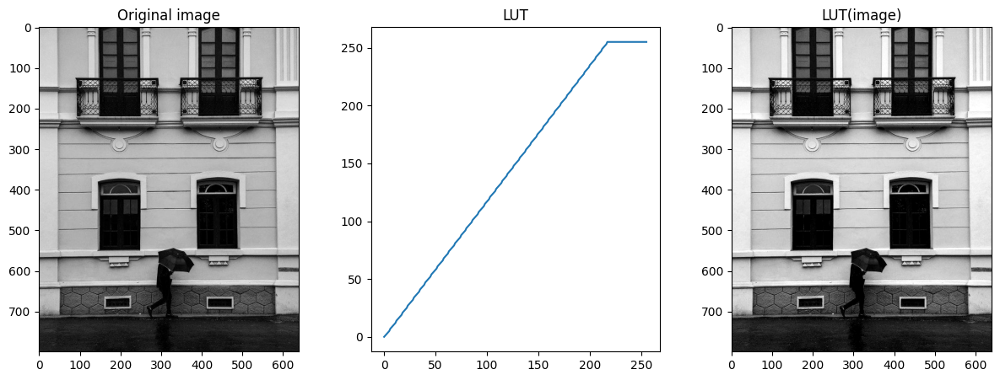

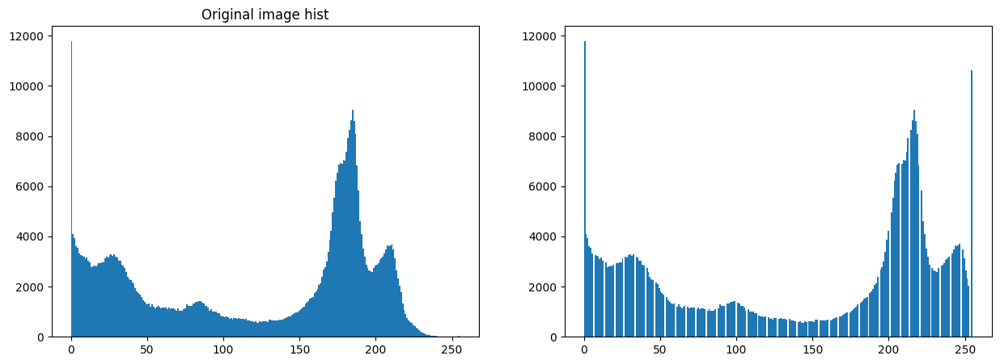

In [9]:
# Compute LUT & apply to image:
lut_auto_level = auto_level(T_min,T_max)
auto_level_im_optimized_tresh = lut_auto_level[im]

plt.figure(figsize=(15,5))
plt.gray()
plt.subplot(1,3,1)
plt.imshow(im)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(lut_auto_level)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(auto_level_im)
plt.title("LUT(image)")

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(im.flatten(),bins=256)
plt.title("Original image hist")
plt.subplot(1,2,2)
plt.hist(auto_level_im_optimized_tresh.flatten(),bins = 256)
plt.show()


This time, Tmin has been set as 0 (so we don't modify the dark tones of the image), and Tmax at 217. The image,which was a bit underexposed, now has a better contrast (but this operation is not lossless!).

We now need to do equalization. The goal of equalization is to distribute the histogram as equally as possible. This is done quite simply by using the cumulative histogram as a look-up table ! We first have to normalize the cumulative histogram to the 0-255 range, then we can use it to equalize the image.

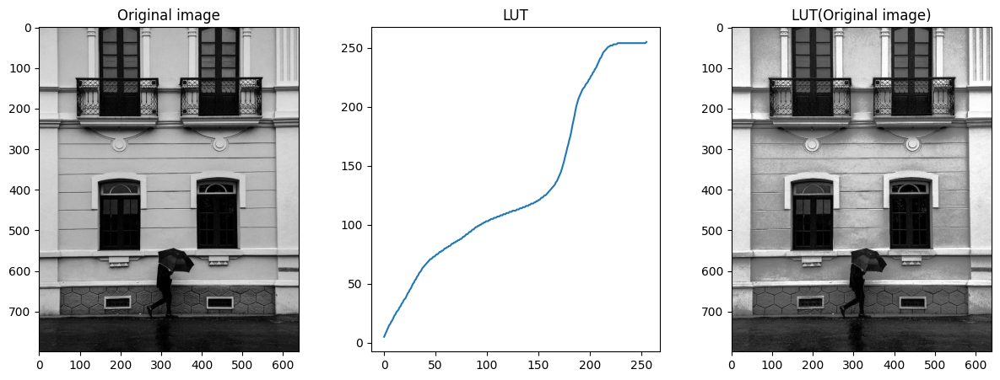

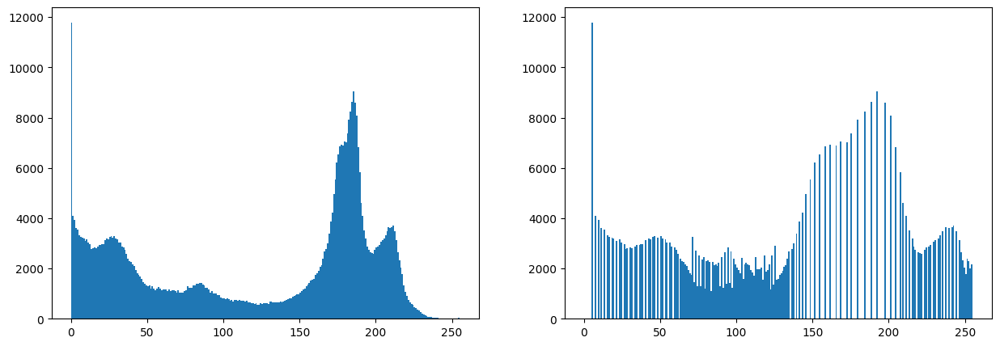

In [10]:
#5 Normalize to 0-255 range & convert to integer
def c_hist(im):
    hist, bins = np.histogram(im, bins=np.arange(257), density=True)
    c_hist = np.zeros((256,))
    c = 0
    for v in range(256):
        c += hist[v]
        c_hist[v] = c
    c_hist /= c_hist.max()
    return c_hist

lut_eq = (255*c_hist(im)).astype(int)
eq_im = lut_eq[im]

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im, cmap = plt.cm.gray)
plt.title("Original image")
plt.subplot(1,3,2)
plt.plot(lut_eq)
plt.title("LUT")
plt.subplot(1,3,3)
plt.imshow(eq_im, cmap=plt.cm.gray)
plt.title("LUT(Original image)")

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.hist(im.flatten(), range(256))
plt.subplot(1,2,2)
plt.hist(eq_im.flatten(), range(256))
plt.show()

As we can see, the peaks of the original histogram have been stretched to use more values, while the lower values were compressed together. This allows us to fully use the entire dynamic range, better than with the auto-level. However, the change is much more noticeable and produces an image that doesn't look natural. Depending on the application, it may or may not be interesting to do it. Here, for instance, details on the windows are more noticeable, but the image gets a "grainy" look.

**Need more help? You can check the following videos:**

* [Look-Up Tables](https://www.youtube.com/watch?v=PHiiKoSsVac&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=13)
* [Auto-levels](https://www.youtube.com/watch?v=DLN4jfBJakQ&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=14)
* [Equalization](https://www.youtube.com/watch?v=C44WuMUudik&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=15)

## 2. Kernel convolution

A convolution (in image processing) is a transformation of an image by a kernel. Each pixel from the original image will be replaced by the sum of all pixels from the neighbourhood defined by the kernel size multiplied element-wise with the values of the kernel. 

Although the convolution operation is available in the scipy library, but before using it we want to code it so as to really understand what's happening. Let's use a small:

In [11]:
# The "image" will be a 5x5 array
a = np.arange(25).reshape((5,5))
new_a = a.copy()
print("a")
print(a)

# We take a 3x3 kernel
k = np.arange(9).reshape((3,3))-4
print("k")
print(k)

# What will the new value of the pixel "6" be in the new image ?
# We have to center the kernel on that pixel, and multiply all the corresponding values:
conv_6 = a[0:3,0:3]*k
print("multiplying neighbourhood of '6' by kernel")
print(conv_6)

# Then we sum those values
new6 = conv_6.sum()
new_a[1,1] = new6

print("image with new value for '6'")
print(new_a)

a
[[ 0  1  2  3  4]
 [ 5  6  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]
k
[[-4 -3 -2]
 [-1  0  1]
 [ 2  3  4]]
multiplying neighbourhood of '6' by kernel
[[ 0 -3 -4]
 [-5  0  7]
 [20 33 48]]
image with new value for '6'
[[ 0  1  2  3  4]
 [ 5 96  7  8  9]
 [10 11 12 13 14]
 [15 16 17 18 19]
 [20 21 22 23 24]]


The most difficult part of the operation is to decide what to do about the borders. What's the neighbourhood of the "0" pixel in the previous example? 

Some common strategies are zero-padding (adding 0s all around the image) or same-padding (giving the pixels "around" the image the same value as the pixel closest to them). Another strategy is to just ignore those and to reduce the size of the image after the convolution.

Now let's make a function to do the convolution on the whole image, using zero-padding:

189
[[ 1.  1.  1.]
 [ 0.  0.  0.]
 [-1. -1. -1.]]
[[ 30 189 184]
 [ 28 189 184]
 [ 26 188 184]]
5.0


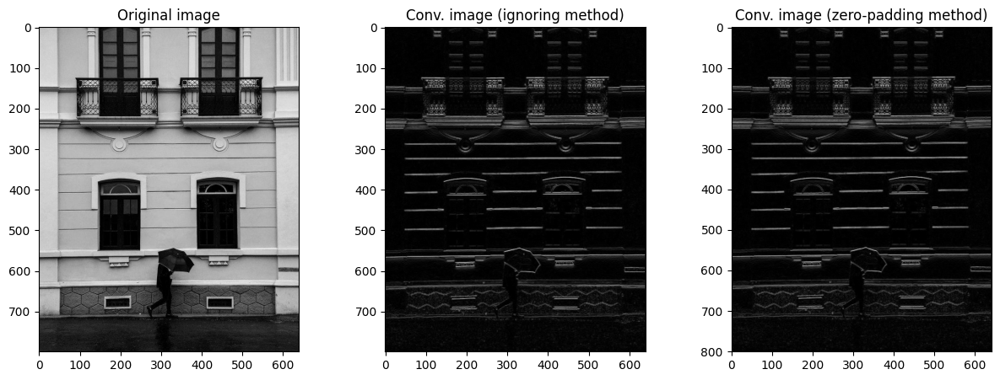

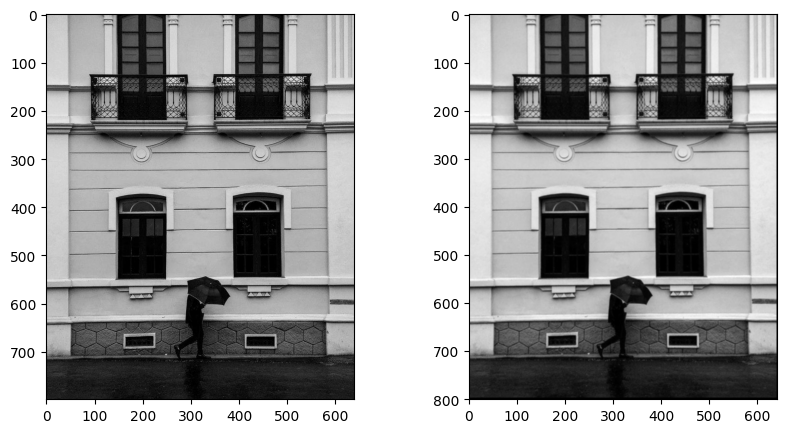

In [12]:
y = 99
x=249
old_value = im[y,x]
print(old_value)

kernel = np.array([[1,0,-1],[1,0,-1],[1,0,-1]]).astype('float').T #.T to pass form a vertical border detector to an horizontal border detector
print(kernel)

ksize = kernel.shape[0]
region = im[y-(ksize//2):y+(ksize//2)+1,x-(ksize//2):x+(ksize//2)+1] # les +1 car les indices de tranche incluent le point de départ mais excluent le point d'arrêt.
print(region)

#Output for one given pixel
new_value = (region*kernel).sum()
print(new_value)

#on image , with the ignoring method
im_out_1 = np.zeros(im.shape)
for y in range(ksize//2,im.shape[0]-ksize//2):
    for x in range(ksize//2,im.shape[1]-ksize//2):
        region = im[y-(ksize//2):y+(ksize//2)+1,x-(ksize//2):x+(ksize//2)+1]
        im_out_1[y,x] =(region*kernel).sum()

#on image, with the zero-padding method
im_out_2 = np.zeros((im.shape[0]+2,im.shape[1]+2))
for y in range(1,im.shape[0]-1):
    for x in range(1,im.shape[1]-1):
        region = im[y-(ksize//2):y+(ksize//2)+1,x-(ksize//2):x+(ksize//2)+1]
        im_out_2[y,x] =(region*kernel).sum()

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im)
plt.title('Original image')
plt.subplot(1,3,2)
plt.imshow(abs(im_out_1)) #Kernel used acts like a vertical border detection, if we take the transposed matric of kernel (by .T) we obtain a horizontal border detector
plt.title('Conv. image (ignoring method)')
plt.subplot(1,3,3)
plt.imshow(abs(im_out_2))
plt.title('Conv. image (zero-padding method)')
plt.show()

#kernel of the precedent exercice 
kern2 = np.ones((3,3))/9.
k2_size = kern2.shape[0]
im_out_3 = np.zeros((im.shape[0]+2,im.shape[1]+2))
for y in range(1,im.shape[0]-1):
    for x in range(1,im.shape[1]-1):
        region = im[y-(k2_size//2):y+(k2_size//2)+1,x-(k2_size//2):x+(k2_size//2)+1]
        im_out_3[y,x] =(region*kern2).sum()


plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(im)
plt.subplot(1,2,2)
plt.imshow(im_out_3)
plt.show()

As we can see, this particular kernel has the effect of blurring slightly the image. A bigger kernel would blur it more.

For the next part, we will use the skimage implementations of the mean & median filters and see how they perform at noise reduction. We start with the noisy image, and try some mean filters with different sizes.

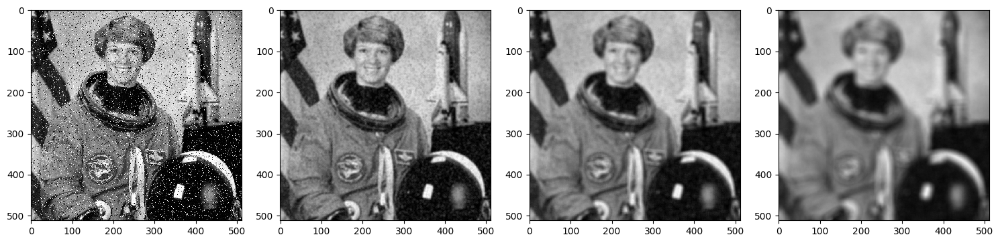

In [13]:
from skimage.filters.rank import mean, median
from skimage.morphology import disk

noisy_im = imread('astronaut_noisy.jpg')

plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
imshow(noisy_im)
plt.subplot(1,4,2)
imshow(mean(noisy_im,disk(3)))
plt.subplot(1,4,3)
imshow(mean(noisy_im,disk(5)))
plt.subplot(1,4,4)
imshow(mean(noisy_im,disk(10)))
plt.show()

As we can see, the noise is reduced, but we lose a lot of details on the image. Compare with the median filter:

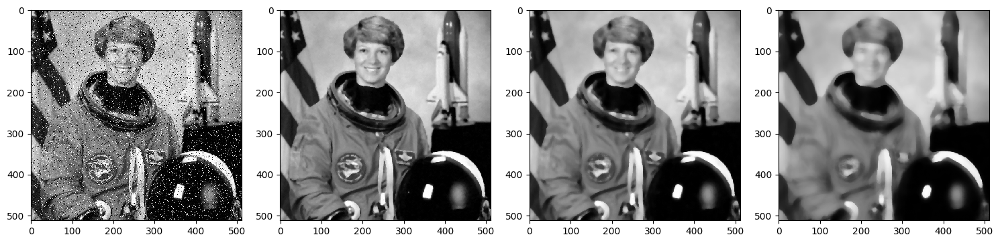

In [14]:
plt.figure(figsize=(15,5))
plt.subplot(1,4,1)
imshow(noisy_im)
plt.subplot(1,4,2)
imshow(median(noisy_im,disk(3)))
plt.subplot(1,4,3)
imshow(median(noisy_im,disk(5)))
plt.subplot(1,4,4)
imshow(median(noisy_im,disk(10)))
plt.show()

We see that the median filter removes the salt and pepper noise almost entirely, while keeping the image sharp. Even when using a larger kernel, the main borders of the image are still visible.

**Need more help? You can check the following videos:**

* [Kernel convolution](https://www.youtube.com/watch?v=FaTvGWPnLng&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=16)
* [Mean and Median filters](https://www.youtube.com/watch?v=GLTuF3lwDLs&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=17)

## 3. 2D Fourier transform

The 2D Fourier transform allows us to get a representation of the spatial frequencies present in an image. A very powerful way of filtering images is to modify those frequencies directly by modifying the "Fourier image", and to use the inverse transform to get the pixel values of the filtered image.

Let's illustrate that with a fake example. We start with a completely random signal and compute the Fourier transform. Note that the Fourier image is complex, so we use its amplitude. As the range of amplitudes is so high that we don't see much in the resulting image, we display the log of the amplitude.

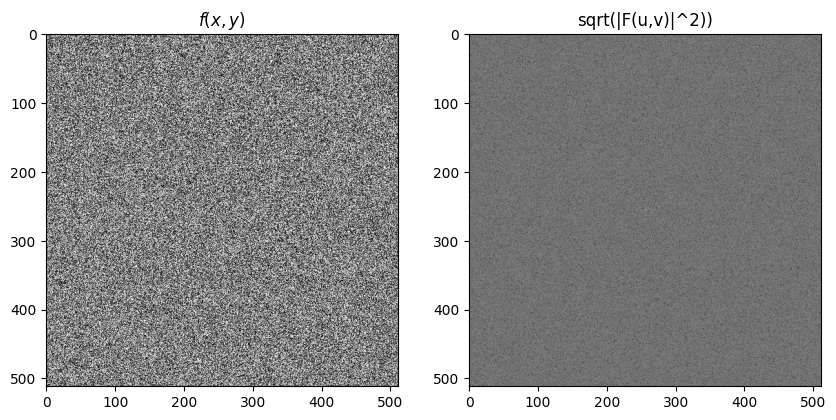

In [15]:
from numpy.fft import fft2,ifft2,fftshift,ifftshift
# fft2 -> Fourier transform 2D
def fourier2(im):
    return(fftshift(fft2(im)))
# ifft2 -> Inverse transform 2D
def ifourier2(f):
    return np.real(ifft2(ifftshift(f)))
# fftshift & ifftshift -> reorganize the "Fourier image" to make it more easily interpretable.
#Amplitude
def amplitude(f):
    return np.sqrt(np.real(f)**2+np.imag(f)**2)
#Phase
def phase(f):
    return np.arctan2(np.imag(f),np.real(f))

im = np.random.random((512,512))
f = fourier2(im)
amp = amplitude(f)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(amp))# show log so as to see more than just the global maximum
plt.title('sqrt(|F(u,v)|^2))')
plt.show()

We could now, for instance, decide to add an horizontal frequency by creating peaks in the Fourier image on the horizontal axis. The further away from the center we put the peaks, the higher the frequency.

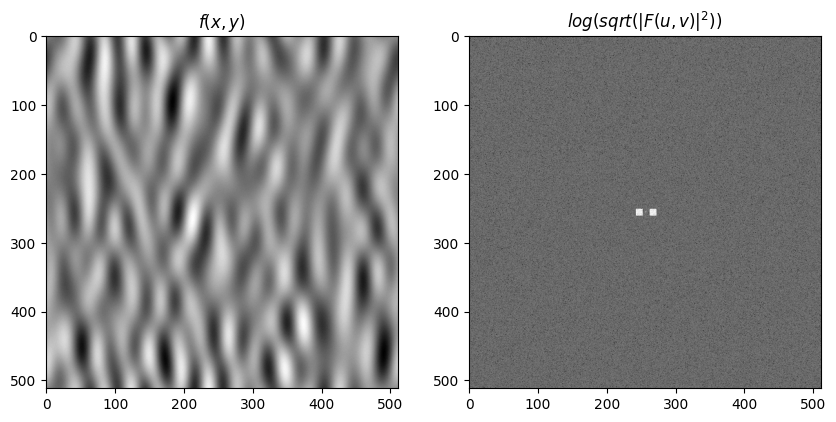

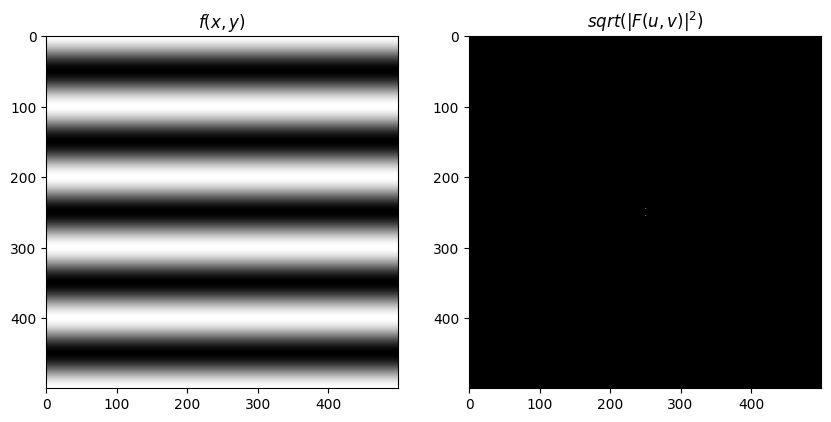

In [16]:
f2 = f.copy()
f2[252:262,262:272] *= 1000 # Amplifie une plage à droite du centre du spectre (fréquence positive dans l'axe horizontal).
f2[252:262,242:252] *= 1000 #Amplifie une plage à gauche du centre du spectre (fréquence négative dans l'axe horizontal).
ampl2 = amplitude(f2)
im2 = ifourier2(f2)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im2,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(ampl2))# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.show()

#exemple plus representatif
f3 = np.zeros((500,500))
f3[255,250] = 1. #ajout variation horizontales dans image
f3[245,250] = 1.
#f2[250,255] = 1. #ajout variation verticales dans image
#f2[255,255] = 1. #ajout variation diago /
#f2[255,245] = 1. #ajout diago \

ampl3 = amplitude(f3)
im3 = ifourier2(f3)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im3,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(ampl3)# show log so as to see more than just the global maximum
plt.title('$sqrt(|F(u,v)|^2)$')
plt.show()

#Variations verticales dans un image = changement d'intensité des pixels dans la direction verticale = 
# par ex bande noire et blanches horizontales dans l'image => correspondent a une freq située le long de l'axe horizontal dans le domaine de Fourier

Now we could also decide to mask the central region, which would remove the peaks that we just created and put all those values at zero. The image will once again look random:

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\1236339715.py:11: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl_m))# show log so as to see more than just the global maximum


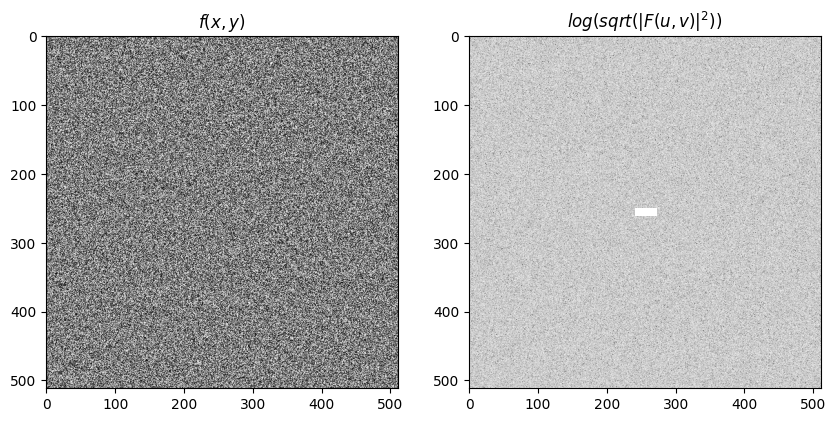

In [17]:
mask = f2.copy()
mask[252:262,242:272] = 0
ampl_m = amplitude(mask)
im_m = ifourier2(mask)

plt.figure(figsize=[10,5])
plt.subplot(1,2,1)
plt.imshow(im_m,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(1,2,2)
plt.imshow(np.log(ampl_m))# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.show()


Starting from those examples and the code below:

1. Use the Fourier transform to reduce the [dithering](https://en.wikipedia.org/wiki/Dither) of the *moire.png* image by building a low-pass filter.
1. Build a high-pass filter using Fourier transform and apply the filter to the "walking" image.

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\1569978706.py:35: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl_low_freq_f), interpolation='none', cmap='viridis')


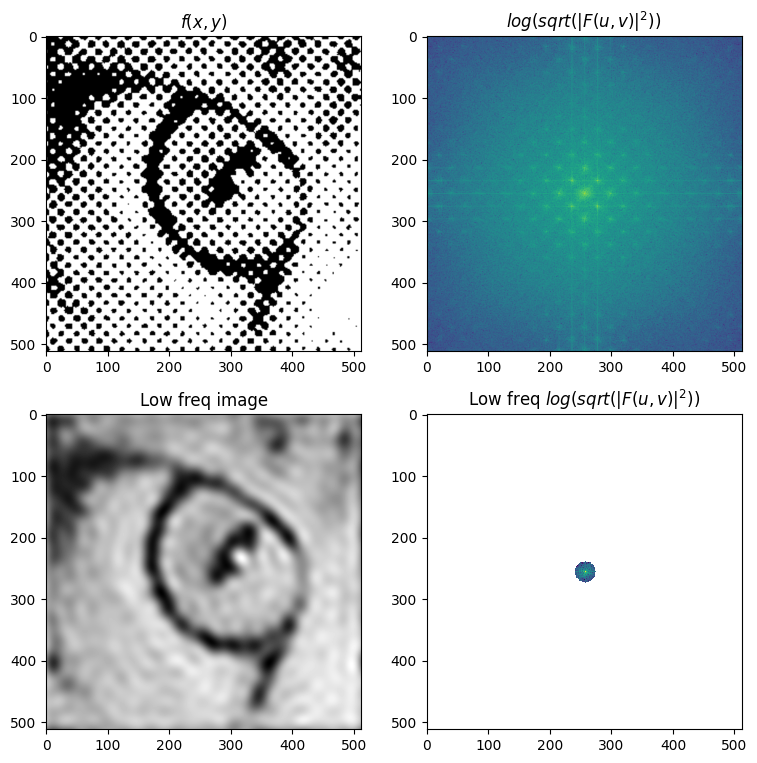

In [18]:
from numpy.fft import fft2,ifft2,fftshift,ifftshift

# Quick function to create a disk shaped mask to apply to our Fourier image (way better than a square mask! -> created patterns where not wanted)
def get_disk_mask(r, imshape):
    a, b = imshape[0]//2, imshape[1]//2
    y,x = np.ogrid[-a:imshape[0]-a, -b:imshape[1]-b] #génére deux tableaux 2D représentant les coordonnées verticales (𝑦y) et horizontales (x) décalées par rapport au centre
    mask = x**2 + y**2 <= r**2
    return mask

# Only keep the low frequencies
    
im_moire = imread('moire1.png')
f_moire = fourier2(im_moire)
ampl_f_moire = amplitude(f_moire)

mask_low_freq = get_disk_mask(17,f_moire.shape)
low_freq_f = f_moire*mask_low_freq
ampl_low_freq_f = amplitude(low_freq_f)
im_moire_low_freq = ifourier2(low_freq_f)




plt.figure(figsize=(9,9))
plt.subplot(2,2,1)
plt.imshow(im_moire,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(2,2,2)
plt.imshow(np.log(ampl_f_moire),cmap = 'viridis')# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.subplot(2,2,3)
plt.imshow(im_moire_low_freq)
plt.title('Low freq image')
plt.subplot(2,2,4)
plt.imshow(np.log(ampl_low_freq_f), interpolation='none', cmap='viridis')
plt.title('Low freq $log(sqrt(|F(u,v)|^2))$')
plt.show()

We can see that the Fourier transform of this image has many very distinct peaks, which indicates a very repetitive pattern, much more pronouced than in the "walking" image.

So how can we use that to improve the moire image and remove the dithering ?

This dithering is "encoded" in the high frequency peaks. What happens if we remove those and only keep the "center" of the Fourier image ?

In [19]:
# Quick function to create a disk shaped mask to apply to our Fourier image
def get_disk_mask(r, imshape):
    a, b = imshape[0]//2, imshape[1]//2
    y,x = np.ogrid[-a:imshape[0]-a, -b:imshape[1]-b] #génére deux tableaux 2D représentant les coordonnées verticales (𝑦y) et horizontales (x) décalées par rapport au centre
    mask = x**2 + y**2 <= r**2
    return mask



C:\Users\regna\AppData\Local\Temp\ipykernel_13068\831247443.py:28: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl_low_freq_f), interpolation='none', cmap='viridis')


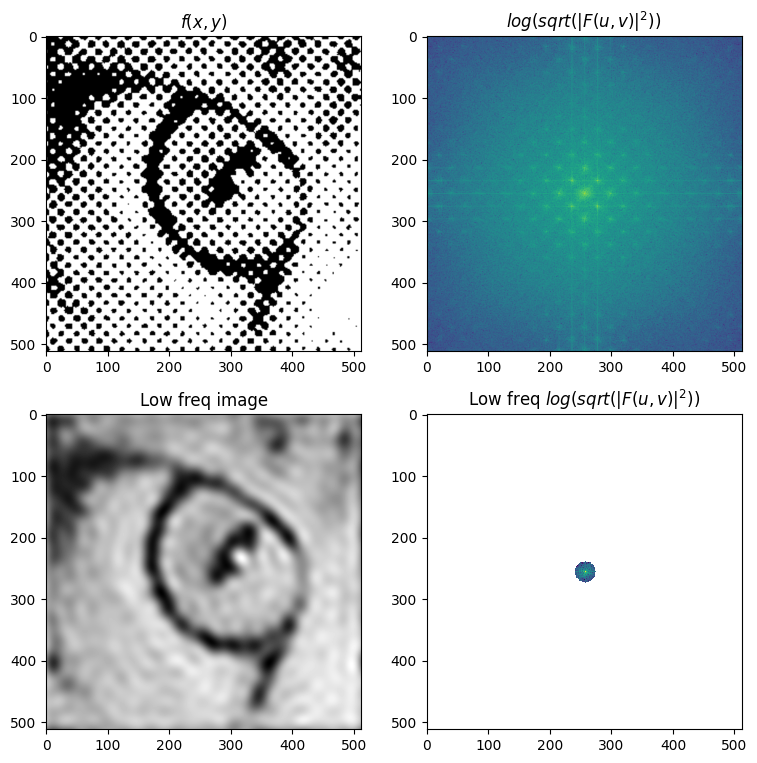

In [20]:
# Only keep the low frequencies
def low_pass(r, im):
    a, b = im[0]//2, im[1]//2
    y,x = np.ogrid[-a:im[0]-a, -b:im[1]-b] #génére deux tableaux 2D représentant les coordonnées verticales (𝑦y) et horizontales (x) décalées par rapport au centre
    mask_LPF = x**2 + y**2 <= r**2
    return mask_LPF
#Orgignal image - Fourier domain
im_moire = imread('moire1.png')
f_moire = fourier2(im_moire)
ampl_f_moire = amplitude(f_moire)
#Low rfreq image - Fourier domain
mask_low_freq = low_pass(17,f_moire.shape)
low_freq_f = f_moire*mask_low_freq
ampl_low_freq_f = amplitude(low_freq_f)
im_moire_low_freq = ifourier2(low_freq_f)

plt.figure(figsize=(9,9))
plt.subplot(2,2,1)
plt.imshow(im_moire,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(2,2,2)
plt.imshow(np.log(ampl_f_moire),cmap = 'viridis')# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.subplot(2,2,3)
plt.imshow(im_moire_low_freq)
plt.title('Low freq image')
plt.subplot(2,2,4)
plt.imshow(np.log(ampl_low_freq_f), interpolation='none', cmap='viridis')
plt.title('Low freq $log(sqrt(|F(u,v)|^2))$')
plt.show()

This operation is actually a low-pass filter, which removes the high frequencies. In the same way, we can create a high-pass filter to only let those high frequencies pass.

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\255396195.py:28: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl_high_freq_f), interpolation='none', cmap='viridis')


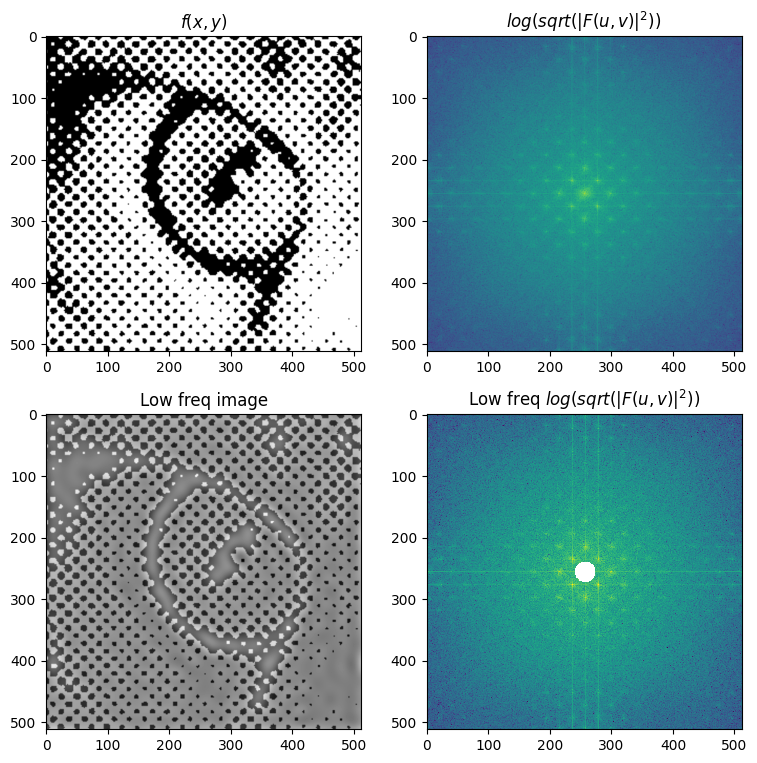

In [21]:
def high_pass(r,im):
    a, b = im[0]//2, im[1]//2
    y,x = np.ogrid[-a:im[0]-a, -b:im[1]-b] #génére deux tableaux 2D représentant les coordonnées verticales (𝑦y) et horizontales (x) décalées par rapport au centre
    mask_HPF = x**2 + y**2 >= r**2
    return mask_HPF

#Orgignal image - Fourier domain
im_moire = imread('moire1.png')
f_moire = fourier2(im_moire)
ampl_f_moire = amplitude(f_moire)
#Low rfreq image - Fourier domain
mask_high_freq = high_pass(17,f_moire.shape)
high_freq_f = f_moire*mask_high_freq
ampl_high_freq_f = amplitude(high_freq_f)
im_moire_high_freq = ifourier2(high_freq_f)

plt.figure(figsize=(9,9))
plt.subplot(2,2,1)
plt.imshow(im_moire,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(2,2,2)
plt.imshow(np.log(ampl_f_moire),cmap = 'viridis')# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.subplot(2,2,3)
plt.imshow(im_moire_high_freq)
plt.title('Low freq image')
plt.subplot(2,2,4)
plt.imshow(np.log(ampl_high_freq_f), interpolation='none', cmap='viridis')
plt.title('Low freq $log(sqrt(|F(u,v)|^2))$')
plt.show()

This produces a sort of border detector, which we can see a lot better if we take the absolute value:

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\1425522354.py:12: RuntimeWarning: divide by zero encountered in log
  plt.imshow(np.log(ampl_high_freq_f), interpolation='none', cmap='viridis')


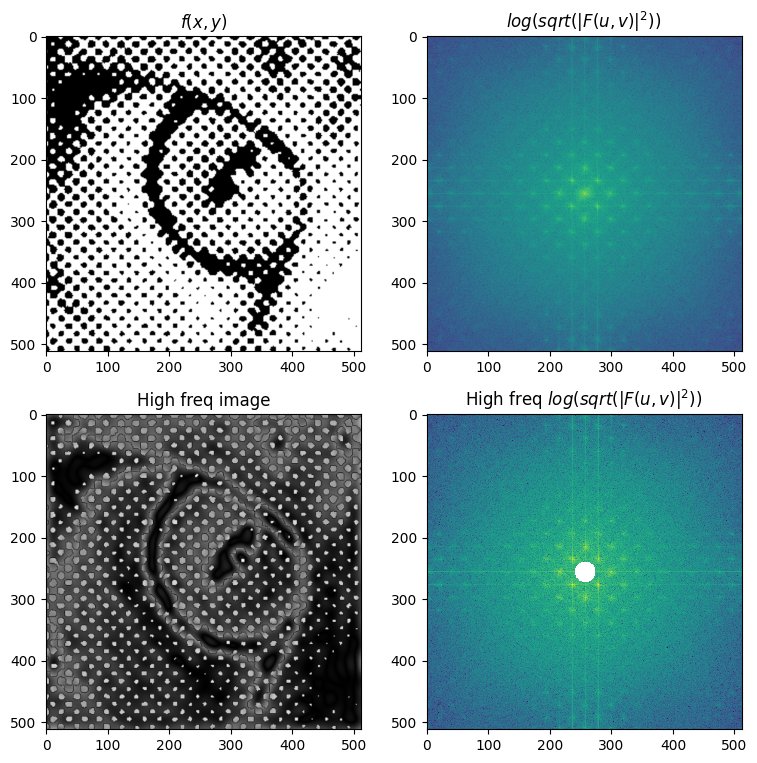

In [22]:
plt.figure(figsize=(9,9))
plt.subplot(2,2,1)
plt.imshow(im_moire,cmap = plt.cm.gray)
plt.title('$f(x,y)$')
plt.subplot(2,2,2)
plt.imshow(np.log(ampl_f_moire),cmap = 'viridis')# show log so as to see more than just the global maximum
plt.title('$log(sqrt(|F(u,v)|^2))$')
plt.subplot(2,2,3)
plt.imshow(np.abs(im_moire_high_freq))
plt.title('High freq image')
plt.subplot(2,2,4)
plt.imshow(np.log(ampl_high_freq_f), interpolation='none', cmap='viridis')
plt.title('High freq $log(sqrt(|F(u,v)|^2))$')
plt.show()

**Need more help? You can check the following videos:**

* [Understanding the 2D Fourier transform](https://www.youtube.com/watch?v=bsNQpeBZ7IY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=18)
* [Filters in Fourier space](https://www.youtube.com/watch?v=8g-sE7wkKpU&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=19)

## 4. Morphological operations

Morphology is a broad set of image processing operations that process images based on shapes.

The most basic morphological operations are dilation and erosion. Dilation adds pixels to the boundaries of objects in an image, while erosion removes pixels on object boundaries. 

Most morphological operations are not performed using either dilation or erosion; instead, they are performed by using both. Two most widely used compound operations are: 
1. Opening: by first performing erosion and then dilation.
1. Closing: by first performing dilation and then erosion


For morphology functions, [see the skimage documentation](http://scikit-image.org/docs/dev/api/skimage.morphology.html?highlight=morphology#module-skimage.morphology)

Let's work with opening and closing on **circles.png**


(512, 512) False True


<Figure size 640x480 with 0 Axes>

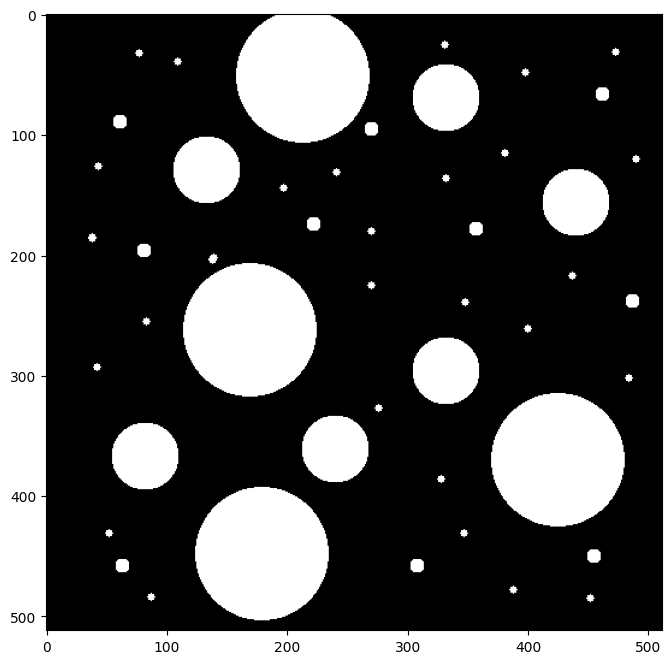

In [28]:
#Load circles.png and display

import skimage.filters.rank as skr
from skimage.morphology import disk
im_circle = (imread('circles1.png')==0) # make sure im is a binary image, to remove circle with opening
print(im_circle.shape, im_circle.min(), im_circle.max())
plt.gray()
plt.figure(figsize=(8,8))
plt.imshow(im_circle)
plt.show()



The opening operation with a disk structuring element allows us to remove circles smaller than the disk. Thus, we can count how many disks we remove when we progressively increase this radius. This gives us a count of the number of disks per radius.

1. Using the "opening" operation with a disk structuring element of increasing size, determine how many circles of any given radius there are in the *circles.png* image.
1. Build a morphological filter that eliminates one size of circles.

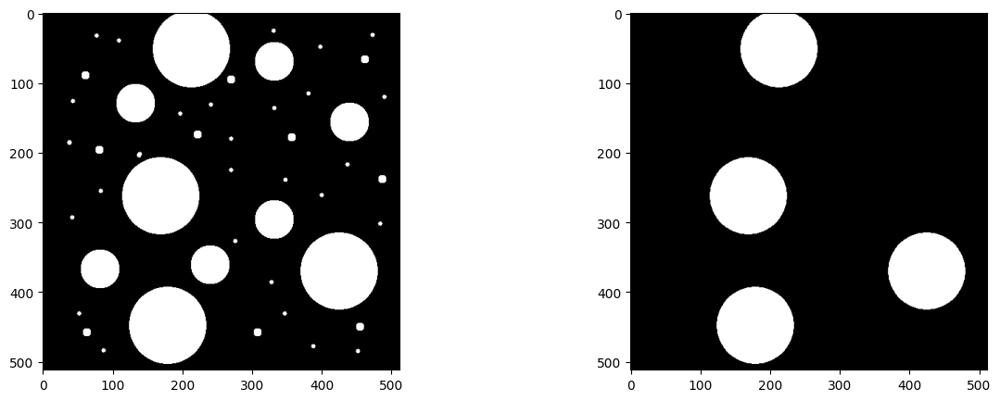

In [ ]:
from skimage.morphology import erosion, dilation
# Opening = dilation(erosion(image))
im = im_circle.copy()

def opening(im,sel):
    return dilation(erosion(im,sel),sel)>0

# Check if opening works
im_opened = opening(im,disk(30)) # disk(30) is a 30x30 disk-shaped structuring element
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(im)
plt.subplot(1,2,2)
plt.imshow(im_opened)
plt.show()


To determine how many circles have disappeared, we have to look at the difference between the image pre- opening and the image post-opening. Let's open the image by progressively larger disks, and count the number of pixels in the remaining image at each step.

In [32]:
im_t = im_circle.copy()
max_r = 60 # maximum radius that we want to try
pixels = np.zeros((max_r,)) # number of remaining pixels after opening with a certain radius
selsurfs = np.zeros((max_r,)) # surface of the structuring element

pixels[0] = im_t.sum()
for r in range(1,max_r):
    im_t = opening(im_circle,disk(r)) # to avoid propagating errors, we always do the opening relative to the original image
    pixels[r] = im_t.sum()
    selsurfs[r] = disk(r).sum()
   



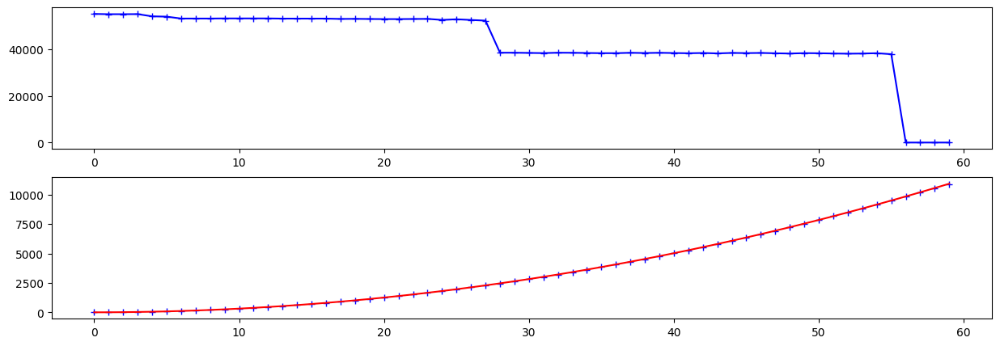

In [33]:
plt.figure(figsize=(15,5))
plt.subplot(2,1,1)
plt.plot(np.arange(max_r), pixels, 'b-+')
plt.subplot(2,1,2)
# Here we check that the surface of the "disk" structuring element is, as expected, equal to pi*r²
plt.plot(np.arange(max_r), selsurfs, 'b+')
plt.plot(np.arange(max_r), np.pi*np.arange(max_r)**2, 'r-')
plt.show()

We can see that the number of remaining pixels mostly remains flat (when the opening didn't remove anything), except for some radius where we suddenly remove many pixels: this corresponds to the radius of the circles. If we divide the "removed pixels" by the "size of the circle", which can be either given by the sum of the structuring element or by $πr^2$, we should get the number of circles removed.

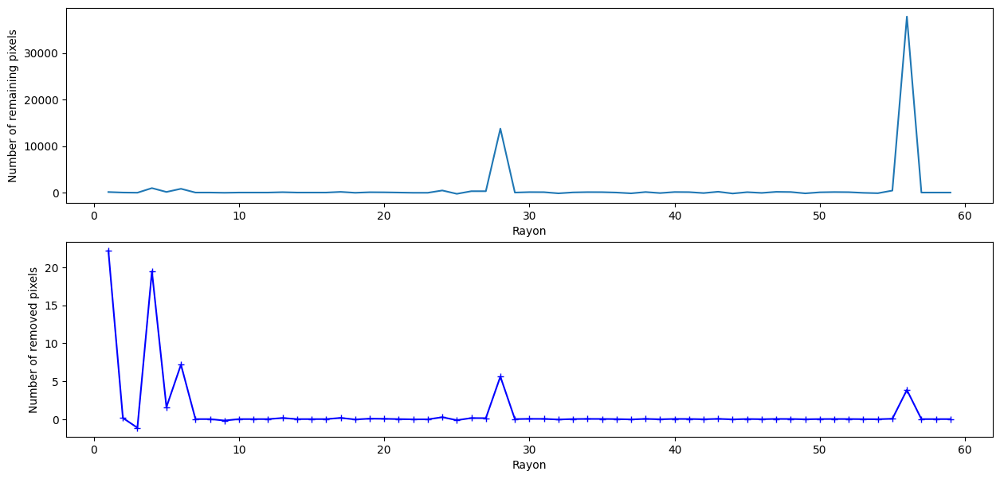

19.46938775510204 circles removed with a rayon equal to 3
1.5802469135802468 circles removed with a rayon equal to 4
7.168141592920354 circles removed with a rayon equal to 5
5.598858540562577 circles removed with a rayon equal to 27
3.8417470797359066 circles removed with a rayon equal to 55


In [49]:
removed_pixels = np.array(pixels[:-1])-np.array(pixels[1:]) #Calcul la différence entre les éléments consécutifs dans un tableau
removed_circles = removed_pixels / np.array(selsurfs)[1:]

plt.figure(figsize=(15,7))
plt.subplot(2,1,1)
plt.plot(np.arange(1,max_r), removed_pixels)
plt.xlabel('Rayon')
plt.ylabel('Number of remaining pixels')
plt.subplot(2,1,2)
plt.plot(np.arange(1,max_r), removed_circles, 'b+-')
plt.xlabel('Rayon')
plt.ylabel('Number of removed pixels')
plt.show()

for r in np.arange(1, max_r-1):
    if( removed_circles[r] > 0.5 ): print(f"{removed_circles[r]} circles removed with a rayon equal to {r}")



As we can see, it's far from perfect, particularly for the smaller circles : that's because the shape of the structuring element is not exactly the same as the circles in the image, which means we have a sort of "border effect", with sometimes the borders of the circle remaining after we substract the opened image, or the shape of the circle being modified by the opening operation. We can see that in action easily :

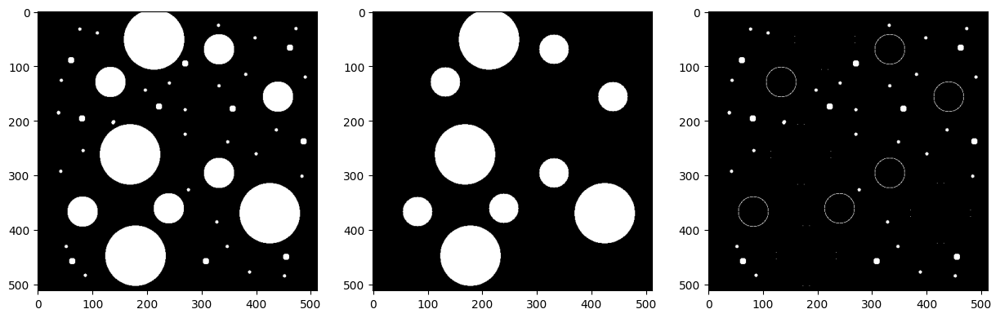

In [48]:
im_opened = opening(im,disk(27))
plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(im)
plt.subplot(1,3,2)
plt.imshow(im_opened)
plt.subplot(1,3,3)
plt.imshow(im^im_opened) # we use here the binary xor operator for subtraction
plt.show()

The "opened" image looks fine, but if we substract it from the original we see that the opening didn't completely restore the circle to their original shape. Still, it's enough to tell us at which radius we can expect to find circles, which should allow us to start trying to eliminate one specific size of circle.

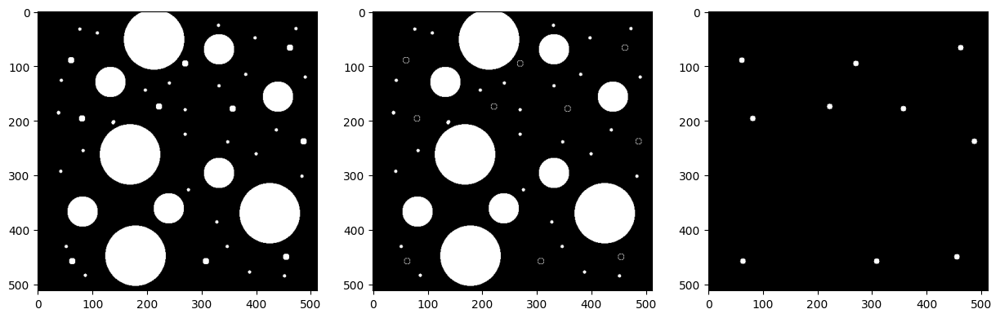

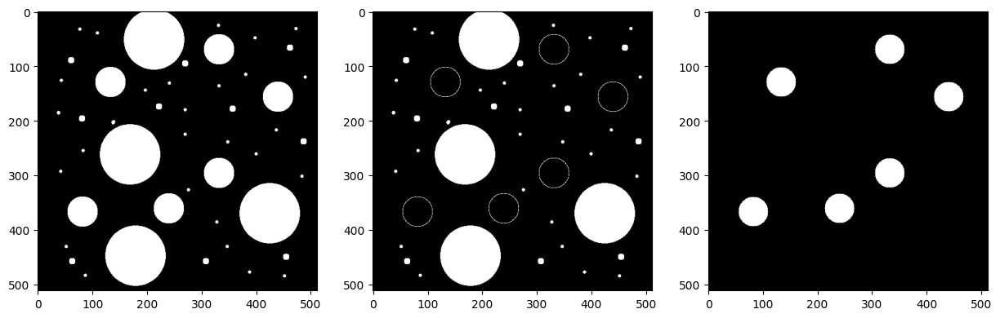

In [52]:
def remove_circle(im,r):
    ## -- Your code here -- ##
    # Opening by r will remove any circle smaller than the target
    smaller_removed = opening(im,disk(r))
    # Opening by a slightly bigger radius will remove any circle smaller than the target, plus all the target circles
    bigger = opening(im,disk(r+1))
    # The difference between im and smaller_removed will contain all the circles smaller than the target
    smaller = im^smaller_removed
    # If we add that to bigger (which contains all the circles bighould get the imageger than r), we s minus the target circles
    return smaller+bigger, im^(smaller+bigger)

for r in [5, 27]:
    removed, targets = remove_circle(im, r)
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im)
    plt.subplot(1,3,2)
    plt.imshow(removed)
    plt.subplot(1,3,3)
    plt.imshow(targets)
    plt.show()

As we can see, the border effect is very visible. We can get a cleaner image by adding another opening with a very small radius just to "clean up" the noise from the image.

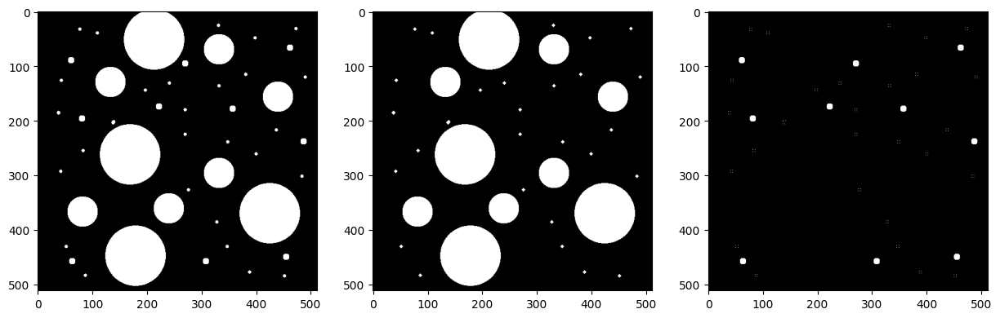

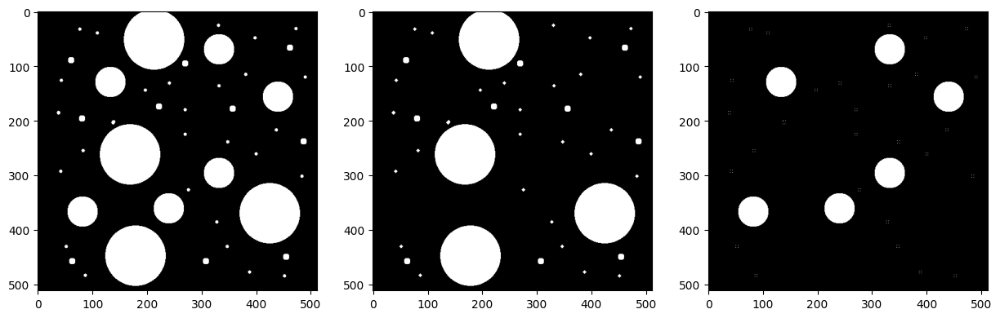

In [53]:
def remove_circle(im,r):
    ## -- Your code here -- ##
    # Opening by r will remove any circle smaller than the target
    smaller_removed = opening(im,disk(r))
    # Opening by a slightly bigger radius will remove any circle smaller than the target, plus all the target circles
    bigger = opening(im,disk(r+1))
    # The difference between im and smaller_removed will contain all the circles smaller than the target
    smaller = im^smaller_removed
    # If we add that to bigger (which contains all the circles bigger than r), we should get the image minus the target circles
    removed = smaller+bigger
    # Clean-up with small opening
    clean = opening(removed, disk(2))
    return clean, im^(clean)

for r in [5, 27]:
    removed, targets = remove_circle(im, r)
    plt.figure(figsize=(15,5))
    plt.subplot(1,3,1)
    plt.imshow(im)
    plt.subplot(1,3,2)
    plt.imshow(removed)
    plt.subplot(1,3,3)
    plt.imshow(targets)
    plt.show()

**Need more help? You can check the following videos:**

* [Morphological operations](https://www.youtube.com/watch?v=b64M2dZaWPA&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=20)

## 5. Edge detection

We have used convolution before to apply a mean filter to blur the image. Other kernels will give other types of output. An example is the Sobel filter, which can be used for edge detection. The goal is to combine an horizontal border detector with a vertical border detector, which both use convolution.

The aim is to use the [convolve2d](http://docs.scipy.org/doc/scipy-0.15.1/reference/generated/scipy.signal.convolve2d.html) function to develop the Sobel filter. 

The Sobel operator is given by
$$\mathbf{G} = \sqrt{ {\mathbf{G}_x}^2 + {\mathbf{G}_y}^2 }$$
where $G_x$ and $G_y$ are images respectively obtained by a convolution.


**Apply the Sobel filter** to find the edges in the "road" image.

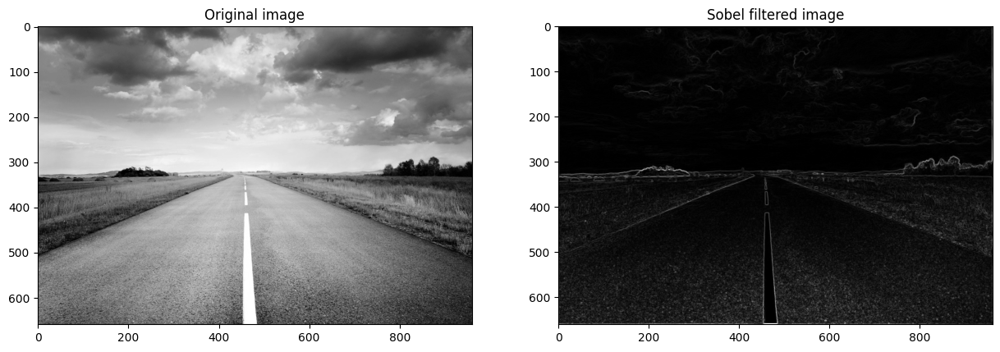

In [61]:
from skimage.data import camera
from skimage.io import imread
from scipy.signal import convolve2d

im_road = imread('road.jpg', as_gray= True)

def sobel_filter(im):
    g_y =  np.array([[-1.,-2.,-1.],[0.,0.,0.],[1.,2.,1.]])
    g_x = g_y.T
    G_x = convolve2d(im,g_x) #apply the convolution for g_x kernel
    G_y = convolve2d(im,g_y) #idem for g_y
    return np.sqrt(G_x**2 + G_y**2)


im = im_road.copy()
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(im)
plt.title("Original image")
plt.subplot(1,2,2)
plt.imshow(sobel_filter(im))
plt.title("Sobel filtered image")
plt.show()



    

The result is very noisy since the Sobel filter is very sensitive to high frequency textures. One way to only get the more meaningful borders could be to combined it with a median filter.

Try applying it:

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\500457614.py:8: UserWarning: Possible precision loss converting image of type float64 to uint8 as required by rank filters. Convert manually using skimage.util.img_as_ubyte to silence this warning.
  im_m = median_filter(im,5)


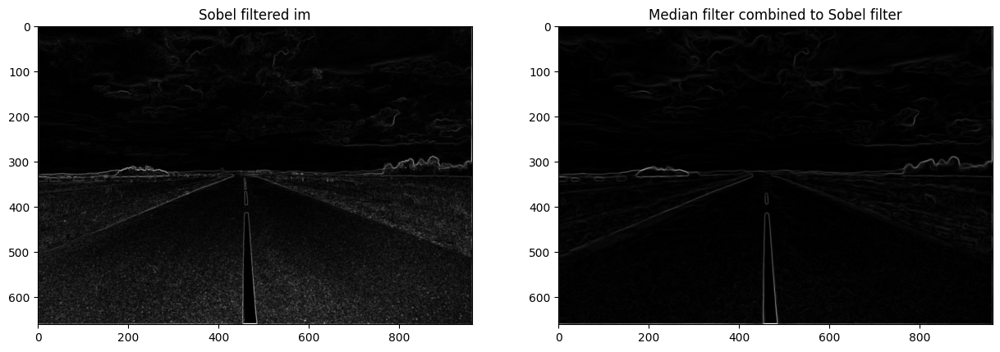

In [69]:
from skimage.filters.rank import median
from skimage.morphology import disk

def median_filter(im,r):
    return median(im,disk(r))

im = imread('road.jpg', as_gray=True)
im_m = median_filter(im,5)

plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.imshow(sobel_filter(im))
plt.title('Sobel filtered im')
plt.subplot(1,2,2)
plt.imshow(sobel_filter(im_m))
plt.title('Median filter combined to Sobel filter')
plt.show()

We can see that the result is much cleaner.



Another common edge detector is the Canny edge filter, which takes as parameter the standard deviation of the gaussian filter which, like we just did for the Sobel, is applied at the beginning of the algorithm.


Compare with the results of the **Canny edge filter** with different "sigma" values (see [the skimage documentation](http://scikit-image.org/docs/dev/auto_examples/edges/plot_canny.html))

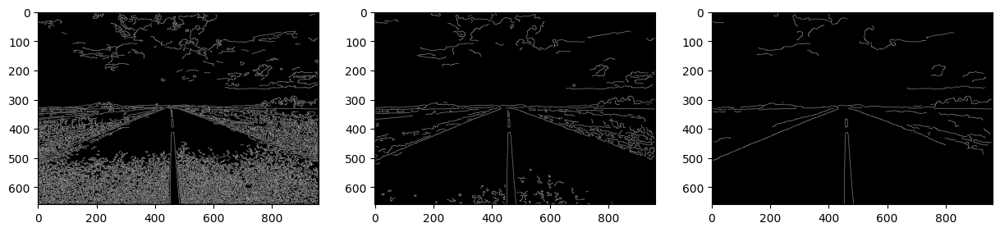

In [72]:
from skimage.feature import canny

def canny_edge_filter(im,stand_dev):
    return canny(im,stand_dev)

plt.figure(figsize=(15,5))
plt.subplot(1,3,1)
plt.imshow(canny_edge_filter(im,1))
plt.subplot(1,3,2)
plt.imshow(canny_edge_filter(im,2))
plt.subplot(1,3,3)
plt.imshow(canny_edge_filter(im,3))
plt.show()



The Canny edge filter, unlike Sobel, produces a binary result. We would get something similar by thresholding the Sobel filter.

We can now use this image as the basis for the **[Hough transform](http://scikit-image.org/docs/dev/auto_examples/edges/plot_line_hough_transform.html)**, to try to detect the main straight lines in the image. 

First, we can look at the image in "Hough space".

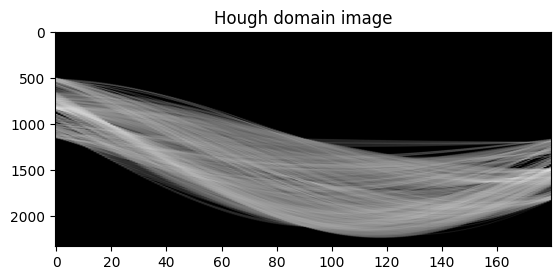

In [73]:
from skimage.transform import hough_line, hough_line_peaks, probabilistic_hough_line

edges = canny(im, sigma=2)

h, theta, d = hough_line(edges)

plt.figure()
plt.imshow(np.log(h+1), aspect=1/30)
plt.title('Hough domain image')
plt.show()

One way of finding the lines is to search for the peaks in Hough space. We can then represent them on the image:

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\286947666.py:4: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
C:\Users\regna\AppData\Local\Temp\ipykernel_13068\286947666.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)


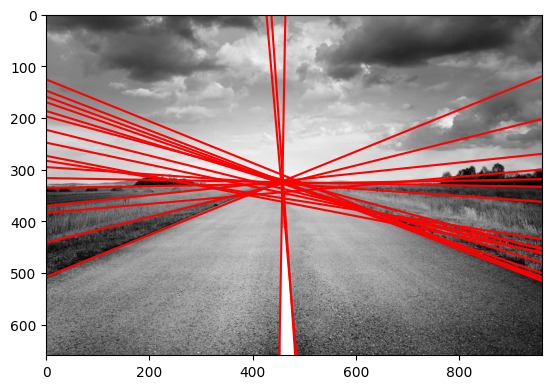

In [74]:
plt.figure()
plt.imshow(im, cmap=plt.cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)
    plt.plot((0, im.shape[1]), (y0, y1), '-r')
plt.xlim([0, im.shape[1]])
plt.ylim([im.shape[0],0])
plt.show()

Try to reduce the number of lines by reducig the number of peaks:

C:\Users\regna\AppData\Local\Temp\ipykernel_13068\881602038.py:4: RuntimeWarning: divide by zero encountered in scalar divide
  y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
C:\Users\regna\AppData\Local\Temp\ipykernel_13068\881602038.py:5: RuntimeWarning: divide by zero encountered in scalar divide
  y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)


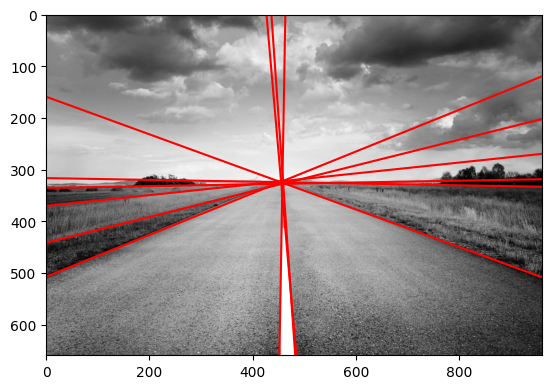

In [75]:

plt.figure()
plt.imshow(im, cmap=plt.cm.gray)
for _, angle, dist in zip(*hough_line_peaks(h, theta, d, num_peaks=10)):
    y0 = (dist - 0 * np.cos(angle)) / np.sin(angle)
    y1 = (dist - im.shape[1] * np.cos(angle)) / np.sin(angle)
    plt.plot((0, im.shape[1]), (y0, y1), '-r')
plt.xlim([0, im.shape[1]])
plt.ylim([im.shape[0],0])
plt.show()

We could also use the **[Probabilistic Hough transform](https://scikit-image.org/docs/stable/auto_examples/edges/plot_line_hough_transform.html)**, which directly gives us line segments from the edge image:

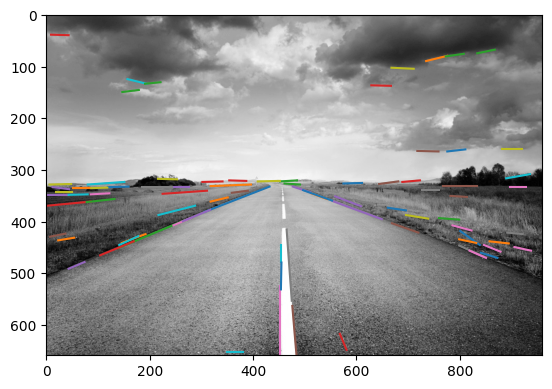

In [77]:
from skimage.transform import probabilistic_hough_line
lines = probabilistic_hough_line(edges, threshold=10, line_length=30, line_gap=5)

plt.figure()
plt.imshow(im, cmap=plt.cm.gray)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]))
plt.show()

We can apply the same to the **walking.jpg** image. Adjusting the threshold allows us to select only the strongest lines.

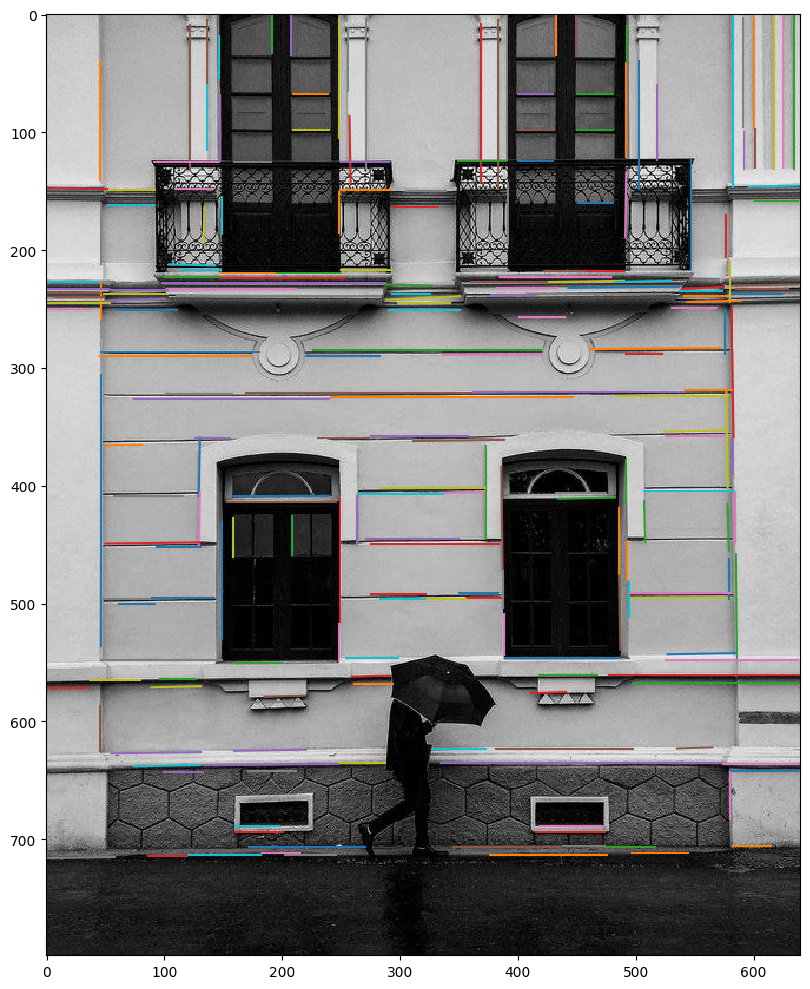

In [86]:
im = imread('walking.jpg')
edges = canny(im, sigma=2)
lines = probabilistic_hough_line(edges, threshold=100, line_length=30, line_gap=5)

plt.figure(figsize=(15,10))
imshow(im)
for line in lines:
    p0, p1 = line
    plt.plot((p0[0], p1[0]), (p0[1], p1[1]))
plt.show()

**Need more help? You can check the following videos:**

* [Edge detection with the Sobel filter](https://www.youtube.com/watch?v=QCjh8yyW-Wo&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=21)
* [Edge detection with the Canny transform](https://www.youtube.com/watch?v=yS5NnpWmuuI&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=22)
* [Line detection with the Hough Transform](https://www.youtube.com/watch?v=GD2xipfKQyY&list=PLI3XOM9BWLSW6vTPxc9ZfSABS31o7HMub&index=23)

# Coding project - Picture enhancement

Write code that automatically enhances a photograph.

<img src="etretat.jpg" width="250px" />
<img src="ex_enhance.jpg" width="250px" />

"Enhance" may mean a lot of different things, and we encourage you to be creative in which enhancements you want to implement.

Some possibilities include (not an exhaustive list):

* Noise reduction
* Auto-level
* Gamma correction (with gamma provided by the user or automatically determined from the image histogram)
* Increase colour saturation
* ...

(900, 1200, 3) 4 255
(900, 1200, 3)


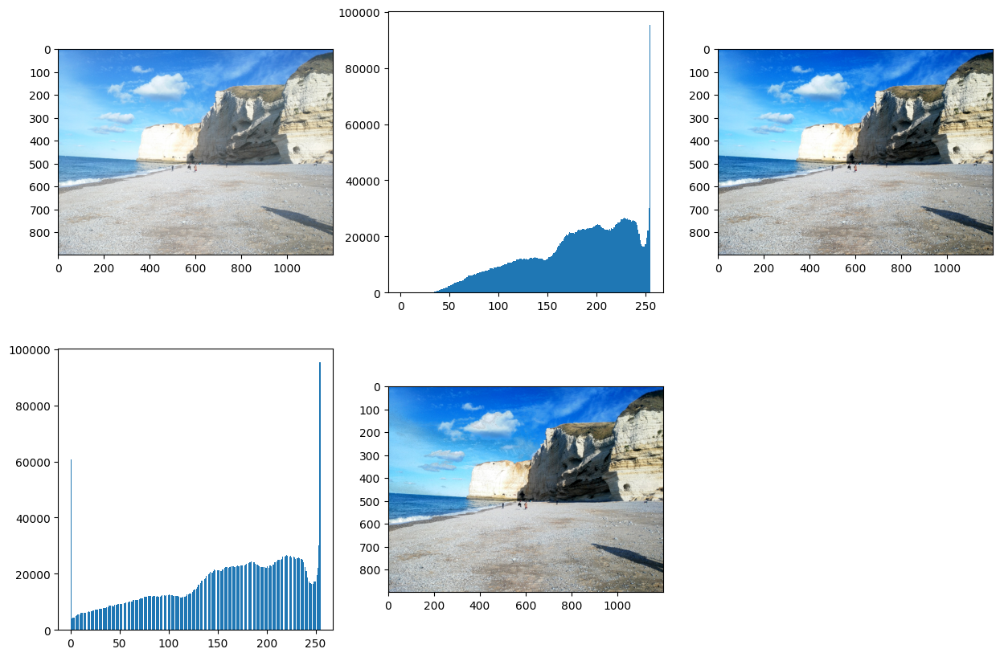

In [202]:
from skimage.color import rgb2hsv, hsv2rgb

im = imread("etretat.jpg")

print(im.shape, im.min(), im.max())
T_min, T_max, c_hist = find_T_min_max(im)
lut_auto_level = auto_level(T_min,T_max)
auto_level_im = lut_auto_level[im]

#Gamma correction
hsv = rgb2hsv(auto_level_im/255.0)
print(hsv.shape)
gamma = 4
tresh_white = 0.95
mask = hsv[:,:,2] > tresh_white
hsv[:, :, 2][mask] = hsv[:, :, 2][mask] ** gamma


plt.figure(figsize=(15,10))
plt.subplot(2,3,1)
plt.imshow(im)
plt.subplot(2,3,2)
plt.hist(im.flatten(), range(256))
plt.subplot(2,3,3)
plt.imshow(auto_level_im)
plt.subplot(2,3,4)
plt.hist(auto_level_im.flatten(), range(256))
plt.subplot(2,3,5)
plt.imshow(((hsv2rgb(satured_im))*255).astype(np.uint8))
plt.show()

